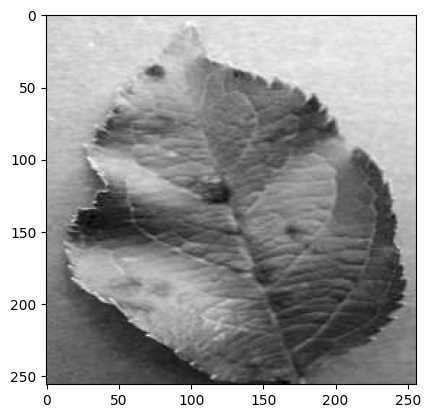

In [2]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np
import cv2 
import os

DATADIR = "dataset7/train/"
CATEGORIES = ["Apple___Apple_scab", "Apple___Black_rot", "Apple___Cedar_apple_rust", "Apple___healthy", "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot", "Corn_(maize)___Common_rust", "Corn_(maize)___healthy", "Corn_(maize)___Northern_Leaf_Blight", "Grape___Black_rot", "Grape___Esca_(Black_Measles)", "Grape___healthy", "Grape___Leaf_blight_(Isariopsis_Leaf_Spot)", "Potato___Early_blight", "Potato___healthy", "Potato___Late_blight", "Tomato___Bacterial_spot", "Tomato___Early_blight", "Tomato___healthy", "Tomato___Late_blight", "Tomato___Leaf_Mold", "Tomato___Septoria_leaf_spot", "Tomato___Spider_mites_two-spotted_spider_mite", "Tomato___Target_Spot", "Tomato___Tomato_mosaic_virus", "Tomato___Tomato_Yellow_Leaf_Curl_Virus"]

for category in CATEGORIES:
    path = os.path.join(DATADIR,category)  # create path to categories
    for img in os.listdir(path):
      # iterate over each image
      # convert to array
      img_array = cv2.imread(os.path.join(path,img) ,cv2.IMREAD_GRAYSCALE)  
      plt.imshow(img_array, cmap='gray')  # graph it
      plt.show()  # display!

      break  # we just want one for now so break
    break  #...and one more!

In [3]:
# Dictionary to format category names
formatted_categories = {}
for category in CATEGORIES:
    plant, disease = category.split("___") if "___" in category else (category, "healthy")
    disease = disease.replace("_", " ").replace("(", "").replace(")", "").replace("  ", " ")
    formatted_categories[category] = (plant, disease)

In [4]:
# Count images per category
image_counts = {}
sample_images = []

In [5]:
for category in CATEGORIES:
    path = os.path.join(DATADIR, category)
    num_images = len(os.listdir(path))
    image_counts[category] = num_images
    
    # Load a sample image for visualization
    first_image_path = os.path.join(path, os.listdir(path)[0])
    sample_images.append((cv2.imread(first_image_path, cv2.IMREAD_GRAYSCALE), formatted_categories[category]))

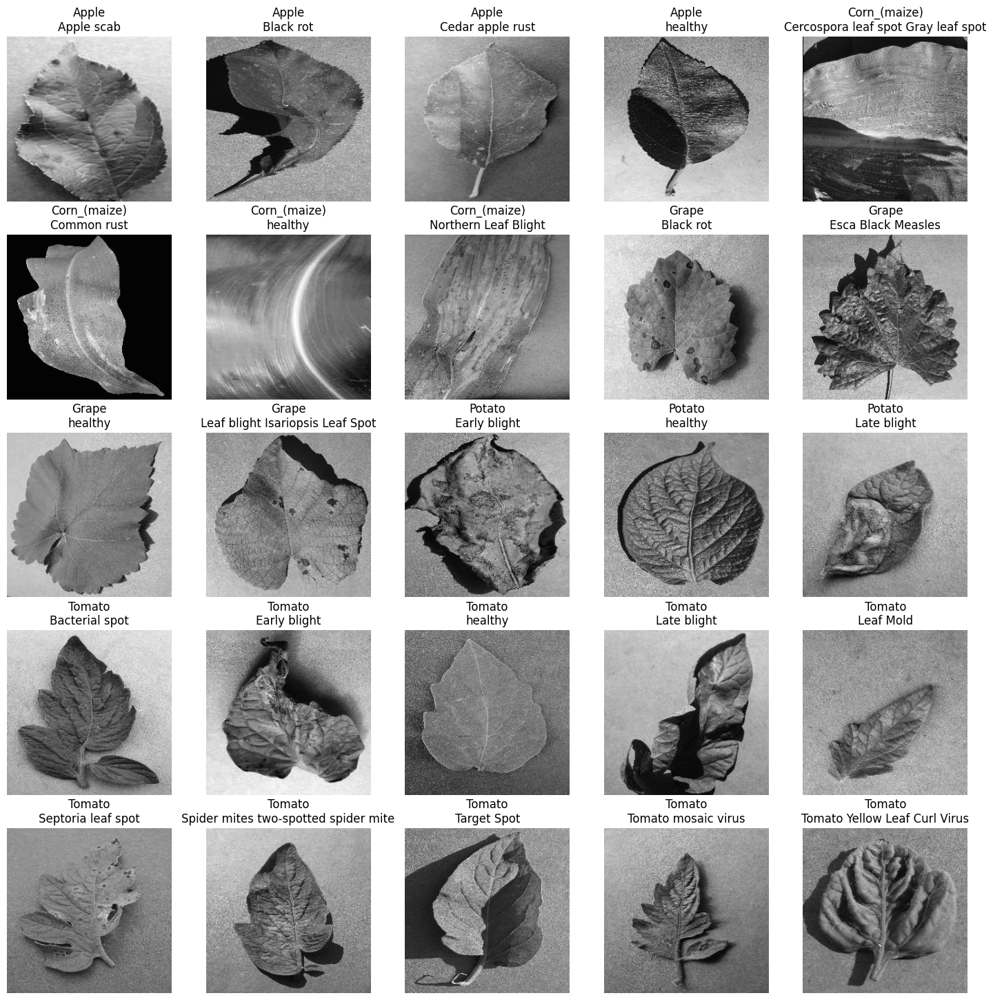

In [6]:
# Display 5x5 grid of sample images
plt.figure(figsize=(18, 18))
for i, (img, (plant, disease)) in enumerate(sample_images[:25]):
    plt.subplot(5, 5, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f"{plant}\n{disease}")
    plt.axis("off")
plt.show()

In [7]:
# Create summary table
import pandas as pd
# Create DataFrame
df = pd.DataFrame([(formatted_categories[k][0], formatted_categories[k][1], v) for k, v in image_counts.items()], 
                  columns=["Plant Name", "Disease Name", "Number of Images"])

# Display table with borders
df.head(25)

,Plant Name,Disease Name,Number of Images
0,Apple,Apple scab,2016
1,Apple,Black rot,1987
2,Apple,Cedar apple rust,1760
3,Apple,healthy,2008
4,Corn_(maize),Cercospora leaf spot Gray leaf spot,1642
5,Corn_(maize),Common rust,1907
6,Corn_(maize),healthy,1859
7,Corn_(maize),Northern Leaf Blight,1908
8,Grape,Black rot,1888
9,Grape,Esca Black Measles,1920


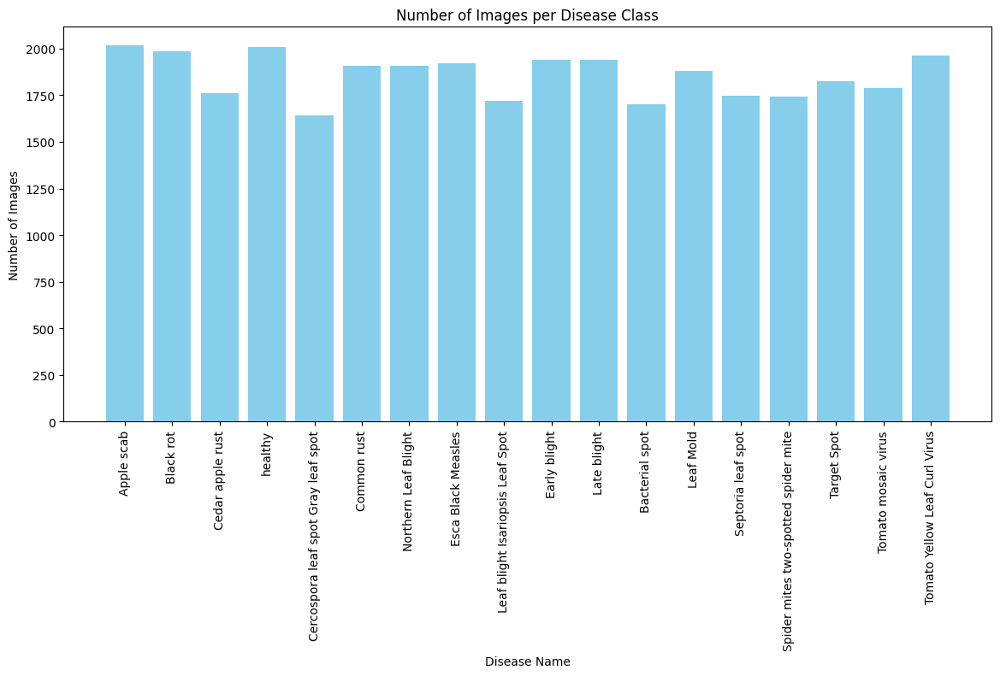

In [8]:
# Plot bar graph
plt.figure(figsize=(14, 6))
plt.bar(df["Disease Name"], df["Number of Images"], color='skyblue')
plt.xticks(rotation=90)
plt.xlabel("Disease Name")
plt.ylabel("Number of Images")
plt.title("Number of Images per Disease Class")
plt.show()

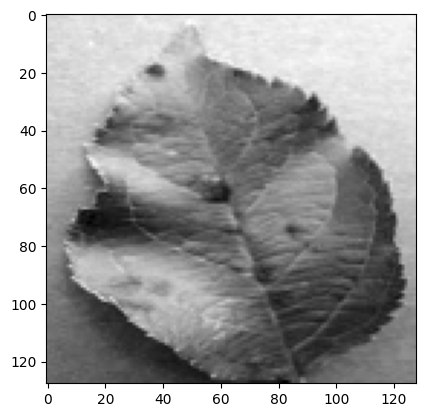

In [9]:
IMG_SIZE = 128

new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
plt.imshow(new_array, cmap='gray')
plt.show() # Show resize image

In [10]:
training_data = []

def create_training_data():
    for category in CATEGORIES:  # do a,b,c, .....

        path = os.path.join(DATADIR,category)  # create path to categories
        class_num = CATEGORIES.index(category)  # get the classification

        for img in tqdm(os.listdir(path)):  # iterate over each image
            try:
                img_array = cv2.imread(os.path.join(path,img) ,cv2.IMREAD_GRAYSCALE)  # convert to array
                new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
                training_data.append([new_array, class_num])  # add this to our training_data
            except Exception as e:  # in the interest in keeping the output clean...
                pass
            
create_training_data() # call function

100%|██████████| 1961/1961 [00:01<00:00, 1295.89it/s]


In [11]:
import random
random.shuffle(training_data)

# Check
for sample in training_data[:10]:
    print(sample[1])

3
9
0
23
4
0
10
5
23
8


In [12]:
X = []
Y = []

for features,label in training_data:
    X.append(features)
    Y.append(label)

print(X[0].reshape(-1, IMG_SIZE, IMG_SIZE, 1))

X = np.array(X).reshape(-1, IMG_SIZE, IMG_SIZE, 1)

[[[[126]
   [123]
   [119]
   ...
   [141]
   [112]
   [ 99]]

  [[114]
   [122]
   [115]
   ...
   [125]
   [108]
   [101]]

  [[122]
   [123]
   [125]
   ...
   [100]
   [ 94]
   [100]]

  ...

  [[192]
   [192]
   [194]
   ...
   [152]
   [155]
   [155]]

  [[194]
   [194]
   [197]
   ...
   [156]
   [156]
   [159]]

  [[199]
   [196]
   [198]
   ...
   [159]
   [155]
   [159]]]]


In [13]:
import pickle

pickle_out = open("X.pickle","wb")
pickle.dump(X, pickle_out)
pickle_out.close()

pickle_out = open("Y.pickle","wb")
pickle.dump(Y, pickle_out)
pickle_out.close()

In [14]:
import tensorflow as tf
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import TensorBoard
import time

import pickle

import re
NAME = "leaf-CNN-Model-{}".format(re.sub(r'[: ]', '_', str(time.ctime())))


# Load pickel data
pickle_in = open("X.pickle","rb")
X = pickle.load(pickle_in)
X = np.array(X).reshape(-1, IMG_SIZE, IMG_SIZE, 1)

pickle_in = open("Y.pickle","rb")
Y = pickle.load(pickle_in)
Y = np.array(Y)

X = X/255.0

model = Sequential()

model.add(Conv2D(16, (2,2), input_shape=X.shape[1:], activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2), padding='same'))

model.add(Conv2D(32, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(3, 3), strides=(3, 3), padding='same'))

model.add(Conv2D(64, (5,5), activation='relu'))
model.add(MaxPooling2D(pool_size=(5, 5), strides=(5, 5), padding='same'))

model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(25, activation='softmax')) # size must be equal to number of classes i.e. 27

tensorboard = TensorBoard(log_dir="logs/{}".format(NAME))

model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#model.fit(X, Y, batch_size=32, epochs=10, validation_split=0.2, callbacks=[tensorboard])

In [15]:
from sklearn.model_selection import train_test_split

# Splitting data into training (80%) and testing (20%)
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

# Train the model with training data
model.fit(X_train, Y_train, batch_size=64, epochs=20, validation_data=(X_test, Y_test), callbacks=[tensorboard])


Epoch 1/20
580/580 [==============================] - 140s 235ms/step - loss: 1.8160 - accuracy: 0.4428 - val_loss: 1.0666 - val_accuracy: 0.6620
Epoch 2/20
580/580 [==============================] - 139s 239ms/step - loss: 1.0381 - accuracy: 0.6649 - val_loss: 0.8435 - val_accuracy: 0.7215
Epoch 3/20
580/580 [==============================] - 135s 233ms/step - loss: 0.8161 - accuracy: 0.7301 - val_loss: 0.6975 - val_accuracy: 0.7680
Epoch 4/20
580/580 [==============================] - 133s 230ms/step - loss: 0.6855 - accuracy: 0.7688 - val_loss: 0.5637 - val_accuracy: 0.8096
Epoch 5/20
580/580 [==============================] - 129s 222ms/step - loss: 0.5914 - accuracy: 0.8004 - val_loss: 0.5530 - val_accuracy: 0.8142
Epoch 6/20
580/580 [==============================] - 133s 229ms/step - loss: 0.5326 - accuracy: 0.8163 - val_loss: 0.5030 - val_accuracy: 0.8288
Epoch 7/20
580/580 [==============================] - 139s 240ms/step - loss: 0.4818 - accuracy: 0.8340 - val_loss: 0.4743 -

In [16]:
# Evaluate accuracy on test data
Model_Results = model.evaluate(X_test, Y_test, verbose=False)
print("LOSS:  " + "%.4f" % Model_Results[0])
print("ACCURACY:  " + "%.2f" % (Model_Results[1] * 100) + "%")

LOSS:  0.3918
ACCURACY:  87.96%


In [17]:
model_json=model.to_json()
with open("model_new.json", "w") as json_file:
    json_file.write(model_json)
    model.save_weights("model_new.h5")
    print("Saved model to disk")

Saved model to disk


In [19]:
# Load the trained model
from tensorflow.keras.models import model_from_json

# Load the model structure
with open("model_new.json", "r") as json_file:
    loaded_model_json = json_file.read()
    loaded_model = model_from_json(loaded_model_json)

# Load weights
loaded_model.load_weights("model_new.h5")
print("Loaded model from disk")

Loaded model from disk


In [22]:
def prepare(filepath):
    IMG_SIZE = 128  # Same size as training images
    img_array = cv2.imread(filepath, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale
    new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # Resize image
    new_array = new_array.reshape(-1, IMG_SIZE, IMG_SIZE, 1)  # Reshape for model input
    new_array = new_array / 255.0  # Normalize
    return new_array

1/1 [==============================] - 0s 15ms/step


c:\Users\Satheeshkumar\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:60: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
c:\Users\Satheeshkumar\AppData\Local\Programs\Python\Python37\lib\site-packages\ipykernel_launcher.py:60: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
c:\Users\Satheeshkumar\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
c:\Users\Satheeshkumar\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


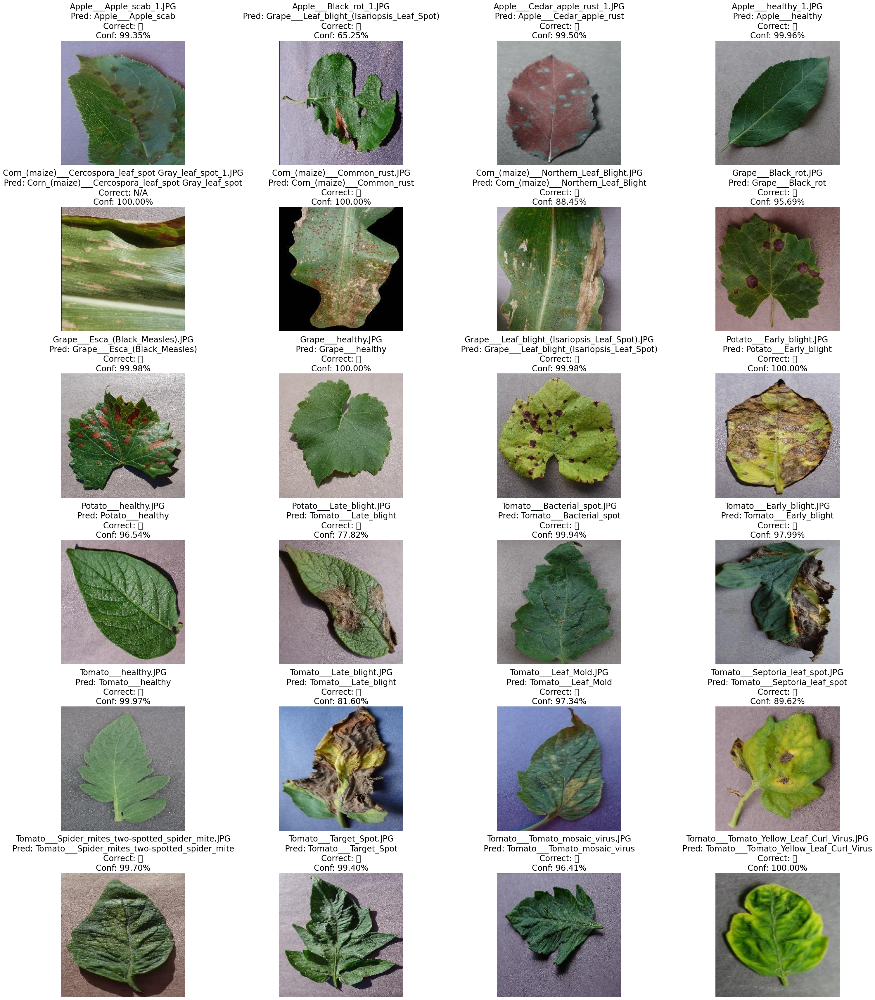

In [23]:
# Folder containing test images
TEST_FOLDER = "test_sample"

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith((".JPG"))]

# Set up subplot grid
rows, cols = 7, 4
total_images = min(len(test_images), rows * cols)  # Limit to available images
fig, axes = plt.subplots(rows, cols, figsize=(30, 40))

# Flatten axes array for easier iteration
axes = axes.flatten()

# Process each image
for i in range(total_images):
    img_name = test_images[i]
    img_path = os.path.join(TEST_FOLDER, img_name)

    # Preprocess image
    img_data = prepare(img_path)
    if img_data is None:
        continue  # Skip if image loading failed

    # Predict class
    prediction = loaded_model.predict(img_data)
    predicted_class = np.argmax(prediction)
    confidence = np.max(prediction) * 100  # Convert to percentage

    # Read original image for display
    img_array = cv2.imread(img_path)
    img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

    # Display image
    axes[i].imshow(img_array)
    axes[i].axis("off")

    # Get ground truth (if available)
    correct_label = "Unknown"
    is_correct = "N/A"

    # Check if ground truth label exists in filename (e.g., Tomato_healthy_01.jpg)
    for category in CATEGORIES:
        if category.replace(" ", "_") in img_name:
            correct_label = category
            is_correct = "✅" if CATEGORIES[predicted_class] == category else "❌"
            break

    # Title with details
    axes[i].set_title(
    f"{img_name}\nPred: {CATEGORIES[predicted_class]}\nCorrect: {is_correct}\nConf: {confidence:.2f}%", 
    fontsize=20  # Increase font size
    )

# Hide extra subplots if fewer images
for j in range(total_images, rows * cols):
    fig.delaxes(axes[j])

# Show the plot
plt.tight_layout()
plt.show()

In [24]:
# Predict on a new image
image_path = "test_sample/Potato___Early_blight.jpg"  # Change to your test image path
prediction = loaded_model.predict(prepare(image_path))

# Get the class label with the highest probability
predicted_class = np.argmax(prediction)
print(f"Predicted sign: {CATEGORIES[predicted_class]}")

1/1 [==============================] - 0s 20ms/step
Predicted sign: Potato___Early_blight


In [27]:
# Function to format prediction result
def format_prediction(predicted_class):
    plant, disease = formatted_categories[CATEGORIES[predicted_class]]
    return f"Plant Name: {plant}, Disease: {disease}"

# Example test image prediction
test_image_path = "test_sample/Grape___Esca_(Black_Measles).jpg"
prediction = loaded_model.predict(prepare(test_image_path))
predicted_class = np.argmax(prediction)
print(format_prediction(predicted_class))


1/1 [==============================] - 0s 16ms/step
Plant Name: Grape, Disease: Esca Black Measles
